In [1]:
#import basic libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
df = pd.read_csv('/content/phishing_site_urls.csv')

In [3]:
df.head(5)

,URL,Label
0,nobell.it/70ffb52d079109dca5664cce6f317373782/...,bad
1,www.dghjdgf.com/paypal.co.uk/cycgi-bin/webscrc...,bad
2,serviciosbys.com/paypal.cgi.bin.get-into.herf....,bad
3,mail.printakid.com/www.online.americanexpress....,bad
4,thewhiskeydregs.com/wp-content/themes/widescre...,bad


In [4]:
df.shape

(549346, 2)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 549346 entries, 0 to 549345
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   URL     549346 non-null  object
 1   Label   549346 non-null  object
dtypes: object(2)
memory usage: 8.4+ MB


In [6]:
df.isnull().sum()

,0
URL,0
Label,0


In [7]:
df.Label.value_counts()

,count
Label,
good,392924
bad,156422


In [8]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
import re

In [9]:
from nltk.tokenize import RegexpTokenizer

In [10]:
tokenizer = RegexpTokenizer(r'[A-Za-z0-9]+')

In [11]:
df.URL[0]

'nobell.it/70ffb52d079109dca5664cce6f317373782/login.SkyPe.com/en/cgi-bin/verification/login/70ffb52d079109dca5664cce6f317373/index.php?cmd=_profile-ach&outdated_page_tmpl=p/gen/failed-to-load&nav=0.5.1&login_access=1322408526'

In [12]:
tokenizer.tokenize(df.URL[0])

['nobell',
 'it',
 '70ffb52d079109dca5664cce6f317373782',
 'login',
 'SkyPe',
 'com',
 'en',
 'cgi',
 'bin',
 'verification',
 'login',
 '70ffb52d079109dca5664cce6f317373',
 'index',
 'php',
 'cmd',
 'profile',
 'ach',
 'outdated',
 'page',
 'tmpl',
 'p',
 'gen',
 'failed',
 'to',
 'load',
 'nav',
 '0',
 '5',
 '1',
 'login',
 'access',
 '1322408526']

In [13]:
df['text_tokenized']=df.URL.map(lambda x: tokenizer.tokenize(x))

In [14]:
df.head()

,URL,Label,text_tokenized
0,nobell.it/70ffb52d079109dca5664cce6f317373782/...,bad,"[nobell, it, 70ffb52d079109dca5664cce6f3173737..."
1,www.dghjdgf.com/paypal.co.uk/cycgi-bin/webscrc...,bad,"[www, dghjdgf, com, paypal, co, uk, cycgi, bin..."
2,serviciosbys.com/paypal.cgi.bin.get-into.herf....,bad,"[serviciosbys, com, paypal, cgi, bin, get, int..."
3,mail.printakid.com/www.online.americanexpress....,bad,"[mail, printakid, com, www, online, americanex..."
4,thewhiskeydregs.com/wp-content/themes/widescre...,bad,"[thewhiskeydregs, com, wp, content, themes, wi..."


In [15]:
from nltk.stem.snowball import SnowballStemmer

In [16]:
stemmer = SnowballStemmer("english")

In [17]:
df['text_stemmed']=df['text_tokenized'].map(lambda l:[stemmer.stem(word) for word in l])

In [18]:
df.head()

,URL,Label,text_tokenized,text_stemmed
0,nobell.it/70ffb52d079109dca5664cce6f317373782/...,bad,"[nobell, it, 70ffb52d079109dca5664cce6f3173737...","[nobel, it, 70ffb52d079109dca5664cce6f31737378..."
1,www.dghjdgf.com/paypal.co.uk/cycgi-bin/webscrc...,bad,"[www, dghjdgf, com, paypal, co, uk, cycgi, bin...","[www, dghjdgf, com, paypal, co, uk, cycgi, bin..."
2,serviciosbys.com/paypal.cgi.bin.get-into.herf....,bad,"[serviciosbys, com, paypal, cgi, bin, get, int...","[serviciosbi, com, paypal, cgi, bin, get, into..."
3,mail.printakid.com/www.online.americanexpress....,bad,"[mail, printakid, com, www, online, americanex...","[mail, printakid, com, www, onlin, americanexp..."
4,thewhiskeydregs.com/wp-content/themes/widescre...,bad,"[thewhiskeydregs, com, wp, content, themes, wi...","[thewhiskeydreg, com, wp, content, theme, wide..."


In [19]:
df['text'] = df['text_stemmed'].map(lambda l: ' '.join(l))

In [20]:
df.head()

,URL,Label,text_tokenized,text_stemmed,text
0,nobell.it/70ffb52d079109dca5664cce6f317373782/...,bad,"[nobell, it, 70ffb52d079109dca5664cce6f3173737...","[nobel, it, 70ffb52d079109dca5664cce6f31737378...",nobel it 70ffb52d079109dca5664cce6f317373782 l...
1,www.dghjdgf.com/paypal.co.uk/cycgi-bin/webscrc...,bad,"[www, dghjdgf, com, paypal, co, uk, cycgi, bin...","[www, dghjdgf, com, paypal, co, uk, cycgi, bin...",www dghjdgf com paypal co uk cycgi bin webscrc...
2,serviciosbys.com/paypal.cgi.bin.get-into.herf....,bad,"[serviciosbys, com, paypal, cgi, bin, get, int...","[serviciosbi, com, paypal, cgi, bin, get, into...",serviciosbi com paypal cgi bin get into herf s...
3,mail.printakid.com/www.online.americanexpress....,bad,"[mail, printakid, com, www, online, americanex...","[mail, printakid, com, www, onlin, americanexp...",mail printakid com www onlin americanexpress c...
4,thewhiskeydregs.com/wp-content/themes/widescre...,bad,"[thewhiskeydregs, com, wp, content, themes, wi...","[thewhiskeydreg, com, wp, content, theme, wide...",thewhiskeydreg com wp content theme widescreen...


In [21]:
good_sites=df[df.Label == 'good']
bad_sites=df[df.Label == 'bad']

In [22]:
good_sites.head()

,URL,Label,text_tokenized,text_stemmed,text
18231,esxcc.com/js/index.htm?us.battle.net/noghn/en/...,good,"[esxcc, com, js, index, htm, us, battle, net, ...","[esxcc, com, js, index, htm, us, battl, net, n...",esxcc com js index htm us battl net noghn en r...
18232,wwweira¯&nvinip¿ncH¯wVö%ÆåyDaHðû/ÏyEùuË\nÓ6...,good,"[www, eira, nvinip, ncH, wV, yDaH, yE, u, 6, r...","[www, eira, nvinip, nch, wv, ydah, ye, u, 6, r...",www eira nvinip nch wv ydah ye u 6 rt u g 0 m ...
18233,'www.institutocgr.coo/web/media/syqvem/dk-óij...,good,"[www, institutocgr, coo, web, media, syqvem, d...","[www, institutocgr, coo, web, media, syqvem, d...",www institutocgr coo web media syqvem dk ij r ...
18234,Yìê koãÕ»Î§DéÎl½ñ¡ââqtò¸/à; Í,good,"[Y, ko, D, l, qt]","[y, ko, d, l, qt]",y ko d l qt
18236,ruta89fm.com/images/AS@Vies/1i75cf7b16vc<Fd16...,good,"[ruta89fm, com, images, AS, Vies, 1i75cf7b16vc...","[ruta89fm, com, imag, as, vie, 1i75cf7b16vc, f...",ruta89fm com imag as vie 1i75cf7b16vc f d16b96...


In [23]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud,STOPWORDS

In [24]:
def plot_wordcloud(
    text,
    mask=None,
    max_words=400,
    max_font_size=120,
    figure_size=(24.0, 16.0),
    title=None,
    title_size=40,
    image_color=False
):
    stopwords = set(STOPWORDS)
    more_stopwords = {'com', 'http'}
    stopwords = stopwords.union(more_stopwords)

    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=max_words,
        max_font_size=max_font_size,
        random_state=42,
        mask=mask
    )

    wordcloud.generate(text)

    plt.figure(figsize=figure_size)

    if image_color and mask is not None:
        image_colors = ImageColorGenerator(mask)
        plt.imshow(
            wordcloud.recolor(color_func=image_colors),
            interpolation='bilinear'
        )
    else:
        plt.imshow(wordcloud, interpolation='bilinear')

    if title:
        plt.title(
            title,
            fontdict={
                'size': title_size,
                'color': 'green',
                'verticalalignment': 'bottom'
            }
        )

    plt.axis('off')
    plt.tight_layout()
    plt.show()


In [25]:
all_text=' '.join(good_sites.text.tolist())

In [26]:
all_text

'esxcc com js index htm us battl net noghn en ref5m 9d bbws b tnefnud d j y j p lr cmp 6 p t p8 i q jq d vt srdig v y fk fv x my r s ki zb tu 9 em q lmj c e el l x h 6 7j u g ip 9o i tv d k xo o o 0 c hi f d 1 6 g 2 p 9 ip vz3 a vwk s d 7n a0 q f tj w2xh t i u s cy j l d 6 4 r u 6 amp offerid newmail en us v2 amp sitest ver 4 www eira nvinip nch wv ydah ye u 6 rt u g 0 m i xz fn 7 u 1 f w c t 0 j ev2 p e z s p s i v jl w j o p h 3 c r qb g z d m q x 9 b t m n p m q a u db q vu r h 7 2 4 j91 www institutocgr coo web media syqvem dk ij r gr0 5dfe cmg g h c b l p l a kzh z t b ua a r g q k c s q n vo4z c g e zh 2 t vx qx n pm dx an a a c b a jl m x x u4 x e b o7 y ko d l qt ruta89fm com imag as vie 1i75cf7b16vc f d16b96 g sd 6vd9 0 9qt5 n s r 7 m0 6 e 5 zw 0 k m o d c 1 h d e e e e h y u u 7 m j v bs u 5kp g9 y k ds g3 4 e x o n h ai p vr 2 y 7 5092 esxcc com js index htm us battl net login en ref ifezuzrus battl net d3 en in ex ao app c m d3b 00 7 0 l1 ph w xyoy vn i f ys o t i wn f cb n

In [27]:
from wordcloud import WordCloud

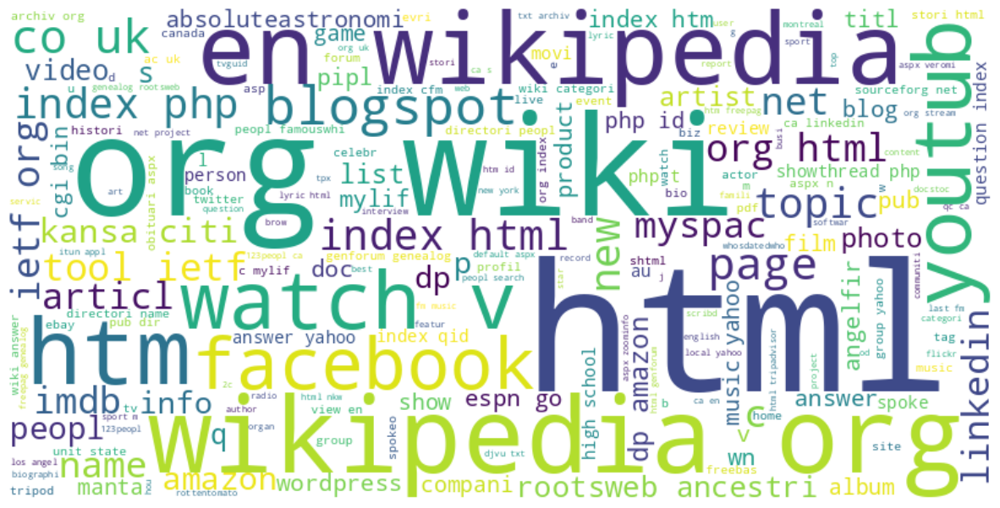

In [28]:
wordcloud= WordCloud(width=800, height=400, background_color='white').generate(all_text)

#display the word cloud
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

In [29]:
all_text2=' '.join(bad_sites.text.tolist())

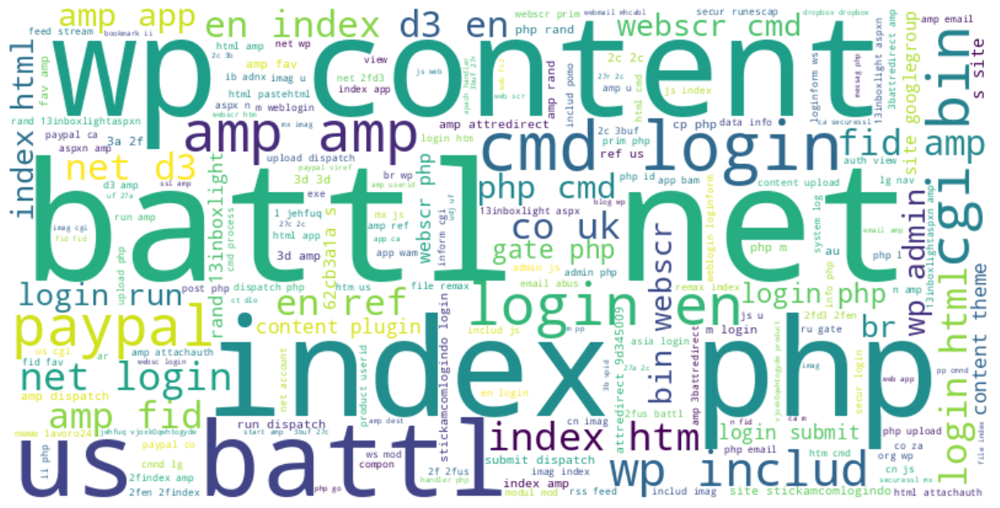

In [30]:
wordcloud= WordCloud(width=800, height=400, background_color='white').generate(all_text2)

#display the word cloud
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

In [31]:
from sklearn.feature_extraction.text import CountVectorizer

In [32]:
cv=CountVectorizer()

In [33]:
feat=cv.fit_transform(df.text)

In [34]:
feat[:5].toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [35]:
from sklearn.model_selection import train_test_split

In [36]:
x_train,x_test,y_train,y_test=train_test_split(feat,df.Label,test_size=0.2)

In [37]:
#Model training

In [37]:
from sklearn.linear_model import LogisticRegression

In [38]:
lmodel=LogisticRegression()

In [39]:
lmodel=LogisticRegression()

In [40]:
lmodel.fit(x_train,y_train)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [41]:
lmodel.score(x_test,y_test)

0.9630381359788841

In [42]:
lmodel.score(x_train,y_train)

0.9781011932392213

In [43]:
from sklearn.metrics import classification_report

In [44]:
print('\nClassification Report\n')
print(classification_report(lmodel.predict(x_test),y_test, target_names=['Bad','Good']))


Classification Report

              precision    recall  f1-score   support

         Bad       0.90      0.97      0.93     29043
        Good       0.99      0.96      0.97     80827

    accuracy                           0.96    109870
   macro avg       0.94      0.97      0.95    109870
weighted avg       0.96      0.96      0.96    109870



In [45]:
from sklearn.metrics import confusion_matrix
confusion_matrix=pd.DataFrame(confusion_matrix(lmodel.predict(x_test),y_test),
                              columns=['Predicted:Bad','Predicted:Good'],
                              index=['Actual:Bad','Actual:Good'])

In [46]:
confusion_matrix

,Predicted:Bad,Predicted:Good
Actual:Bad,28186,857
Actual:Good,3204,77623


In [47]:
import seaborn as sns


Confusion Matrix



<Axes: >

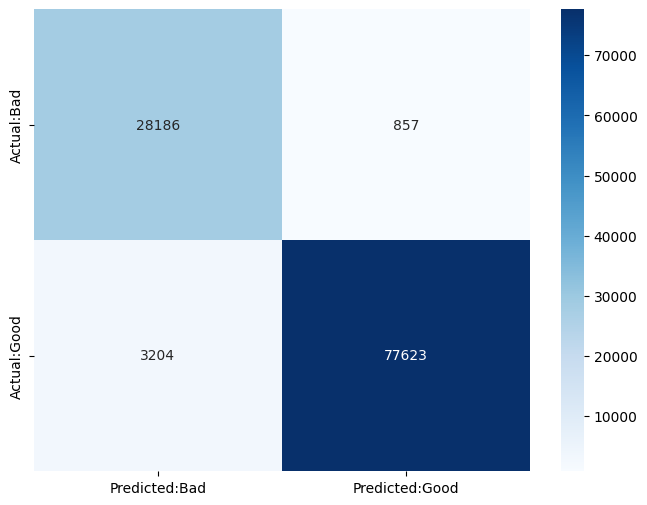

In [48]:
print('\nConfusion Matrix\n')
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues')

In [49]:
import pickle

pickle.dump(lmodel, open('phishing.pkl', 'wb'))
pickle.dump(cv, open('vectoriser.pkl', 'wb'))

In [59]:
#naive bayes algo
from sklearn.naive_bayes import MultinomialNB

In [60]:
mnb=MultinomialNB()

In [61]:
mnb.fit(x_train,y_train)

MultinomialNB()

In [62]:
mnb.score(x_test,y_test)

0.9619550377719123

In [63]:
print('\nClassification Report\n')
print(classification_report(mnb.predict(x_test),y_test, target_names=['Bad','Good']))


Classification Report

              precision    recall  f1-score   support

         Bad       0.93      0.93      0.93     31632
        Good       0.97      0.97      0.97     78238

    accuracy                           0.96    109870
   macro avg       0.95      0.95      0.95    109870
weighted avg       0.96      0.96      0.96    109870




Confusion Matrix



<Axes: >

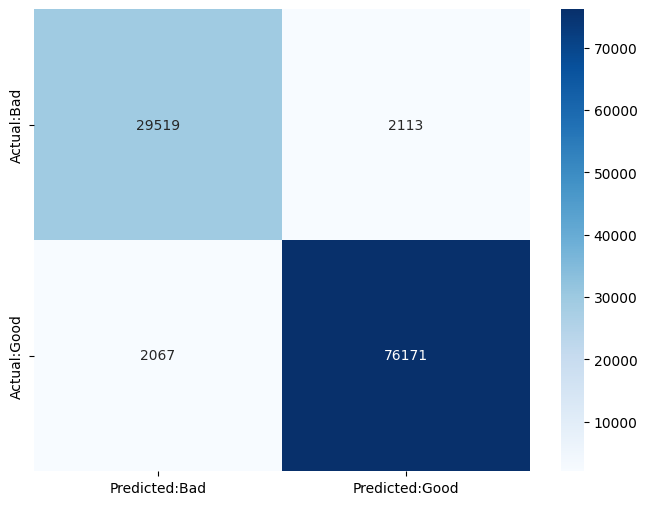

In [64]:
from sklearn.metrics import confusion_matrix
confusion_matrix=pd.DataFrame(confusion_matrix(mnb.predict(x_test),y_test),
                              columns=['Predicted:Bad','Predicted:Good'],
                              index=['Actual:Bad','Actual:Good'])
print('\nConfusion Matrix\n')
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues')